In [1]:
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

ModuleNotFoundError: No module named 'keras'

In [3]:
!pip install keras

ERROR: Could not find a version that satisfies the requirement keras (from versions: none)
ERROR: No matching distribution found for keras


In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
#datadir = '/content/drive/MyDrive'
#datadir = 'screenshot_data'
datadir = ''
columns = ['image', 'width', 'length', 'call_width', 'call_length', 'set_width', 'set_length']
data = pd.read_csv(os.path.join(datadir, 'training_1.csv'), names=columns, sep=';')
pd.set_option('display.max_colwidth', -1)
#data.head()
#for i in range(len(data)):
  #data['image'][i] = os.path.join(datadir, f"screenshot_data/{data['image'][i]}")
  #data['image'][i] = os.path.join(datadir, f"data/{data['image'][i]}")
data.head(10)

C:\Users\I010994\AppData\Local\Temp\ipykernel_19560\3291781421.py:6: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,image,width,length,call_width,call_length,set_width,set_length
0,1.png,1242,2208,340,2073,1050,499
1,2.jpg,736,1472,449,1343,115,372
2,3.png,759,1334,110,1234,456,644
3,4.jpg,236,419,35,392,199,266
4,5.png,421,912,41,872,355,645
5,6.png,422,913,47,863,356,647
6,7.jpg,236,419,36,394,143,266
7,8.jpeg,369,800,55,745,143,399
8,9.jpg,152,331,22,307,22,84
9,10.jpg,152,331,93,309,0,0


In [5]:
for i in range (len(data)):
  call_temp_x = data['width'][i] 
  call_temp_y = data['length'][i]
  call_co_x = (750/call_temp_x) *  data['call_width'][i]
  call_co_y = (1600/call_temp_y) *  data['call_length'][i]
  data['call_width'][i] = int(call_co_x)
  data['call_length'][i] = int(call_co_y)

  set_co_x = (750/call_temp_x) *  data['set_width'][i]
  set_co_y = (1600/call_temp_y) *  data['set_length'][i]
  data['set_width'][i] = int(set_co_x)
  data['set_length'][i] = int(set_co_y)

  data['width'][i] = 750
  data['length'][i] = 1600

data.head()

C:\Users\I010994\AppData\Local\Temp\ipykernel_19560\3976301157.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['call_width'][i] = int(call_co_x)
C:\Users\I010994\AppData\Local\Temp\ipykernel_19560\3976301157.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['call_length'][i] = int(call_co_y)
C:\Users\I010994\AppData\Local\Temp\ipykernel_19560\3976301157.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['set_widt

,image,width,length,call_width,call_length,set_width,set_length
0,1.png,750,1600,205,1502,634,361
1,2.jpg,750,1600,457,1459,117,404
2,3.png,750,1600,108,1480,450,772
3,4.jpg,750,1600,111,1496,632,1015
4,5.png,750,1600,73,1529,632,1131


In [6]:
for i in range (len(data)):
  data['call_width'][i] = data['call_width'][i]/750
  data['call_length'][i] = data['call_width'][i]/750

data.head()

C:\Users\I010994\AppData\Local\Temp\ipykernel_19560\3214605741.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['call_width'][i] = data['call_width'][i]/750
C:\Users\I010994\AppData\Local\Temp\ipykernel_19560\3214605741.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['call_length'][i] = data['call_width'][i]/750


,image,width,length,call_width,call_length,set_width,set_length
0,1.png,750,1600,0.273333,0.000364,634,361
1,2.jpg,750,1600,0.609333,0.000812,117,404
2,3.png,750,1600,0.144000,0.000192,450,772
3,4.jpg,750,1600,0.148000,0.000197,632,1015
4,5.png,750,1600,0.097333,0.000130,632,1131


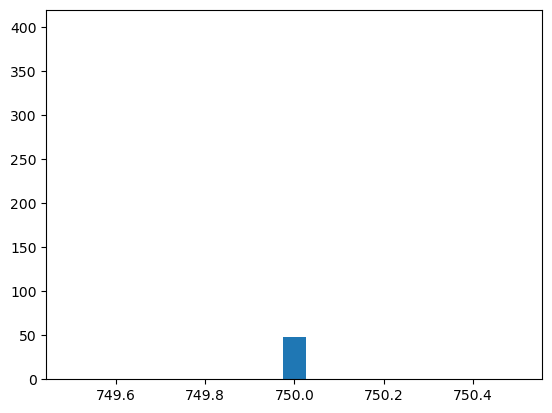

In [7]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['width'], num_bins)
center = (bins[:-1]+bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['width']), np.max(data['width'])), (samples_per_bin, samples_per_bin))

total data:  48
removed 0
remaining:  48


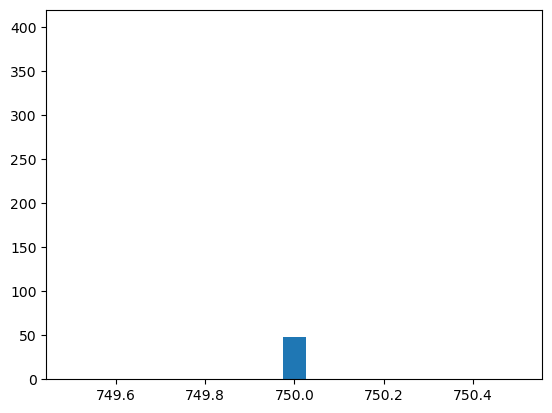

In [8]:
print('total data: ', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['width'])):
    if (data['width'][i] >= bins[j] and data['width'][i] <= bins[j+1]):
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining: ', len(data))

hist, _ = np.histogram(data['width'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['width']), np.max(data['width'])), (samples_per_bin, samples_per_bin))

In [9]:
print(data.iloc[1])

image          2.jpg   
width          750     
length         1600    
call_width     0.609333
call_length    0.000812
set_width      117     
set_length     404     
Name: 1, dtype: object


In [10]:
print(data.iloc[35])
def load_img(datadir, df):
  image_path = []
  coordinates_width = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, width, length = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    temp = []
    temp.append(float(indexed_data[3]))
    temp.append(float(indexed_data[4]))
    coordinates_width.append(temp)
  image_paths = np.asarray(image_path)
  coordinates_width = np.array(coordinates_width)
  print(width)
  return image_paths, coordinates_width

image_paths, coordinates_width = load_img(datadir + 'data', data)
print("The coordinate is ", coordinates_width)

image          36.jpg  
width          750     
length         1600    
call_width     0.149333
call_length    0.000199
set_width      465     
set_length     945     
Name: 35, dtype: object
750
The coordinate is  [[2.73333333e-01 3.64444444e-04]
 [6.09333333e-01 8.12444444e-04]
 [1.44000000e-01 1.92000000e-04]
 [1.48000000e-01 1.97333333e-04]
 [9.73333333e-02 1.29777778e-04]
 [1.10666667e-01 1.47555556e-04]
 [1.52000000e-01 2.02666667e-04]
 [1.48000000e-01 1.97333333e-04]
 [1.44000000e-01 1.92000000e-04]
 [6.10666667e-01 8.14222222e-04]
 [6.12000000e-01 8.16000000e-04]
 [1.49333333e-01 1.99111111e-04]
 [1.42666667e-01 1.90222222e-04]
 [2.49333333e-01 3.32444444e-04]
 [1.26666667e-01 1.68888889e-04]
 [1.50666667e-01 2.00888889e-04]
 [1.44000000e-01 1.92000000e-04]
 [0.00000000e+00 0.00000000e+00]
 [1.16000000e-01 1.54666667e-04]
 [2.74666667e-01 3.66222222e-04]
 [0.00000000e+00 0.00000000e+00]
 [1.48000000e-01 1.97333333e-04]
 [0.00000000e+00 0.00000000e+00]
 [1.33333333e-01 1.7777777

In [11]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, coordinates_width, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 38
Valid Samples: 10


Text(0.5, 1.0, 'Valiidation set')

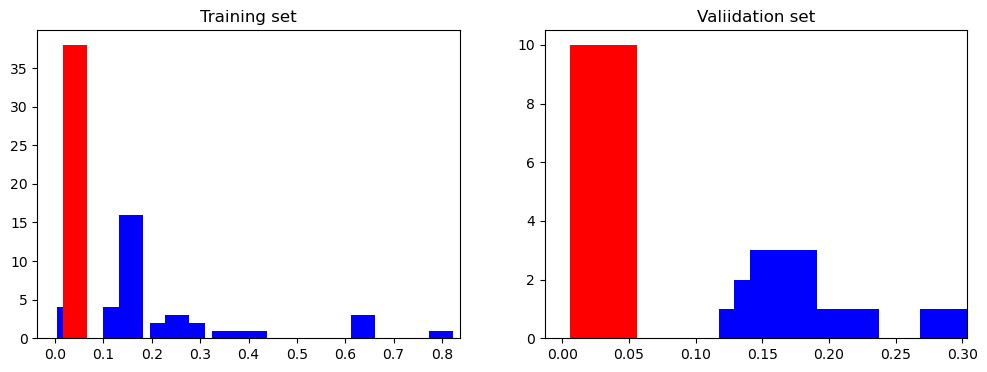

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color=['blue', 'red'])
axes[0].set_title('Training set')

axes[1].hist(y_valid, bins=num_bins, width=0.05, color=['blue', 'red'])
axes[1].set_title('Valiidation set')

In [13]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.15))
  image = zoom.augment_image(image)
  return image

Text(0.5, 1.0, 'Zoomed Image')

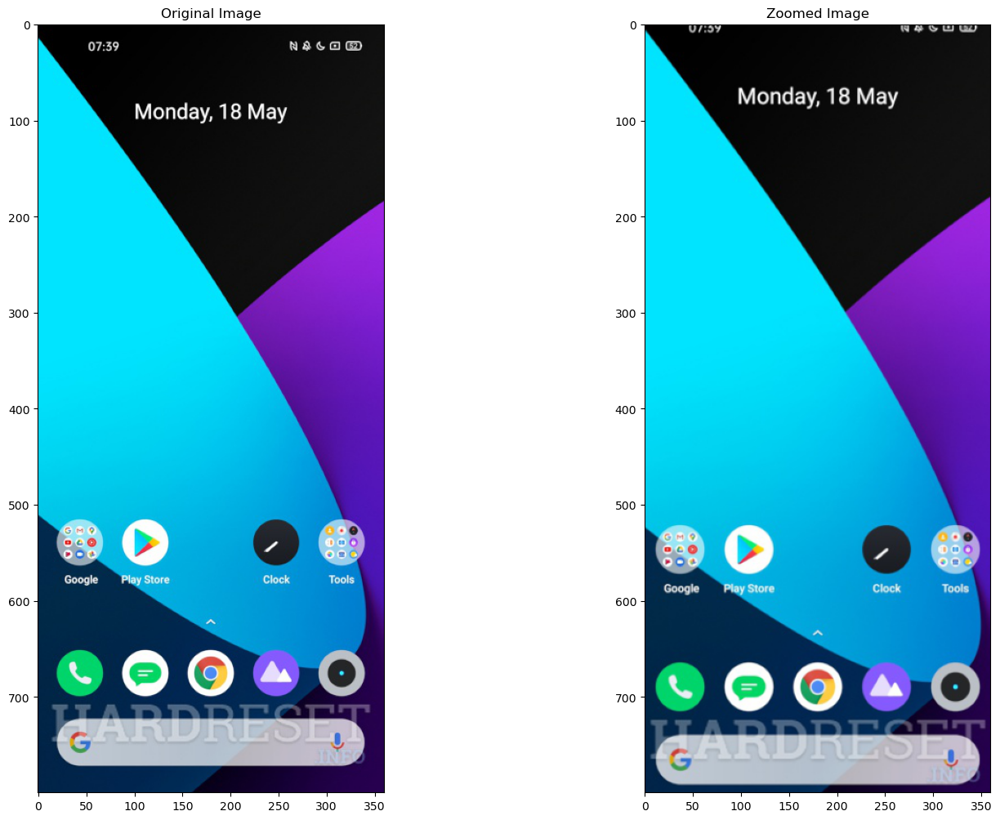

In [14]:
image = image_paths[random.randint(0, 35)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

In [15]:
def pan(image):
  pan = iaa.Affine(translate_percent={"x":(-0.08, 0.08), "y":(-0.08, 0.08)})
  image = pan.augment_image(image)
  return image

Text(0.5, 1.0, 'Panned Image')

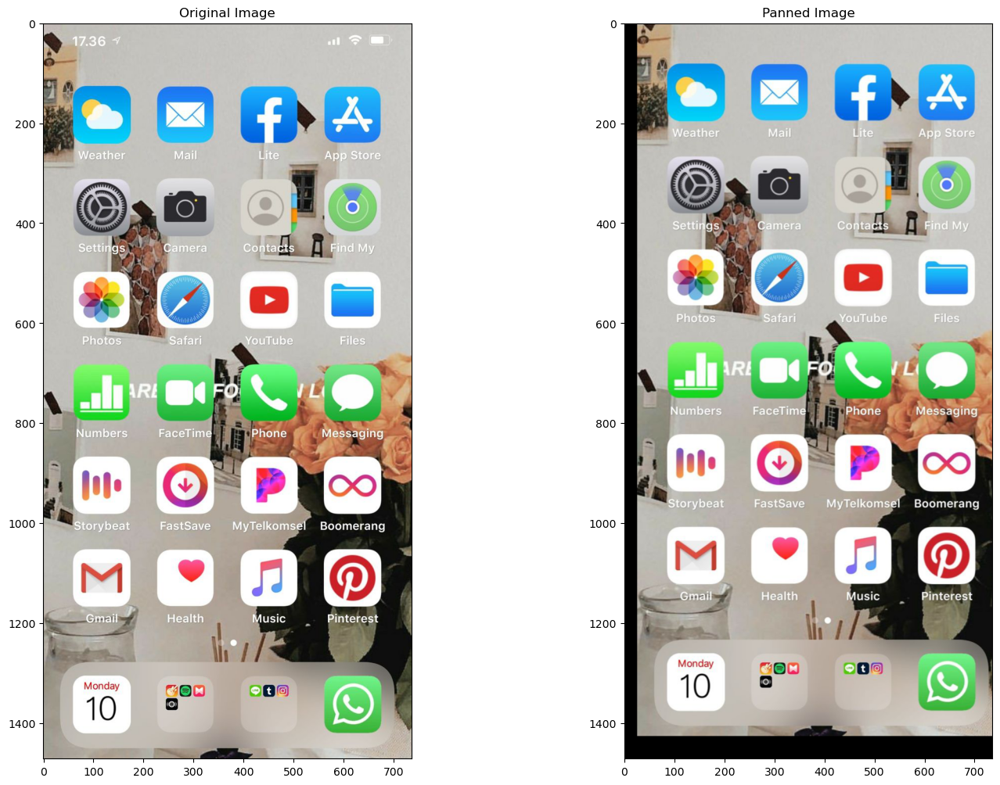

In [16]:
image = image_paths[random.randint(0, 35)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

In [17]:
def img_random_brightness(image):
  # As of experience models recats better to darker immages
  brightness = iaa.Multiply((0.2, 1.2))
  image = brightness.augment_image(image)
  return image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'brightness Altered Image')

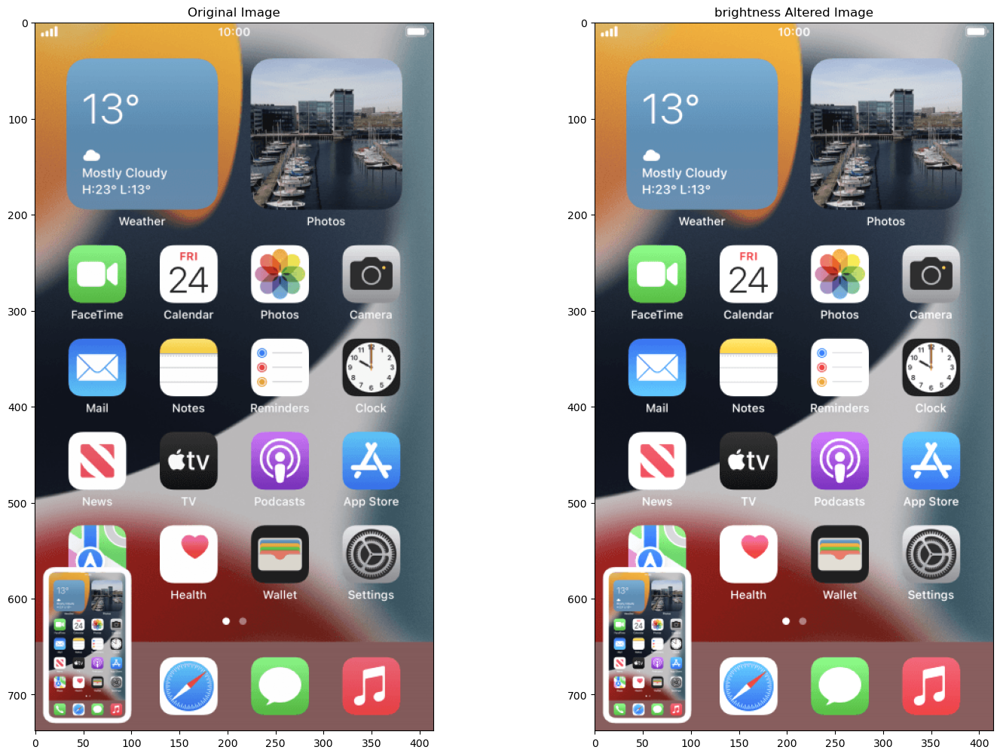

In [18]:
image = image_paths[random.randint(0, 35)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('brightness Altered Image')

In [19]:
def image_random_flip_vertical(image, coordination, random_index):
  image = cv2.flip(image, cv2.ROTATE_90_CLOCKWISE)
  coordination = data.iloc[random_index][2] - coordination
  return image, coordination

Text(0.5, 1.0, 'Flipped Image -Coordinate: 1600.0')

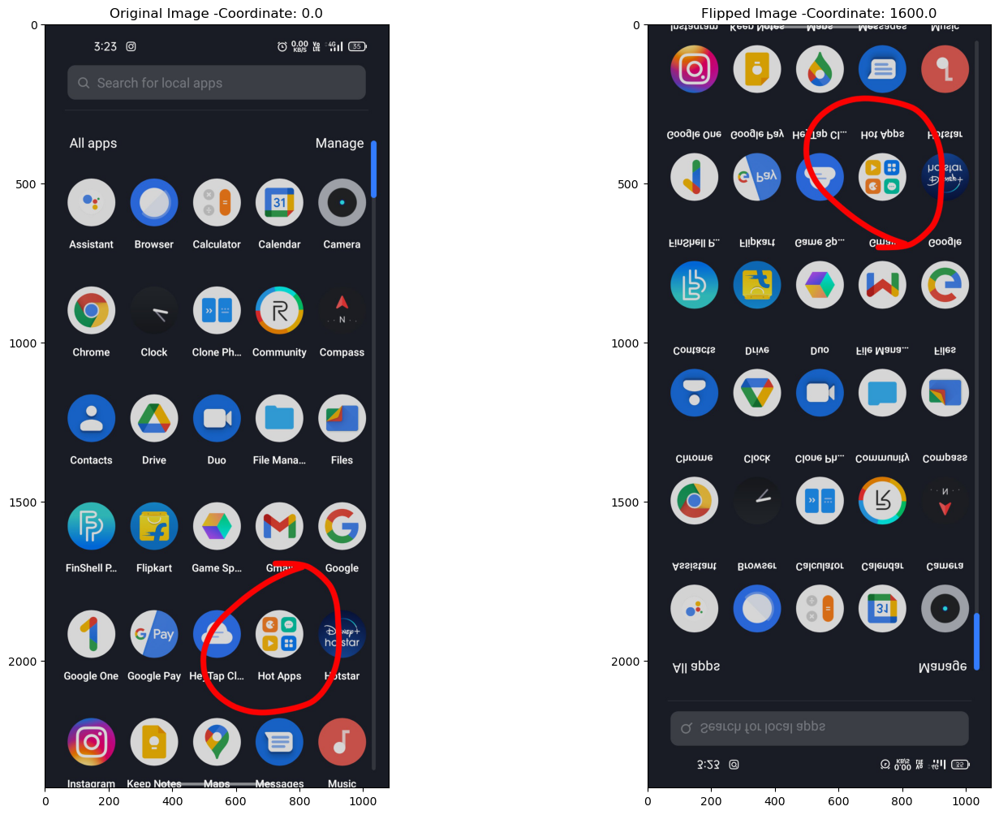

In [20]:
# Flip vertically
random_index = random.randint(0, 35)
image = image_paths[random_index]
coordination = coordinates_width[random_index][1]

original_image = mpimg.imread(image)
flipped_image, flipped_coordination = image_random_flip_vertical(original_image, coordination, random_index)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image -' + 'Coordinate: ' + str(coordination))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image -' + 'Coordinate: ' + str(flipped_coordination))

In [21]:
def image_random_flip(image, coordination, random_index):
  image = cv2.flip(image, 1)
  coordination = data.iloc[random_index][1] - coordination
  return image, coordination

Text(0.5, 1.0, 'Flipped Image -Coordinate: 749.3906666666667')

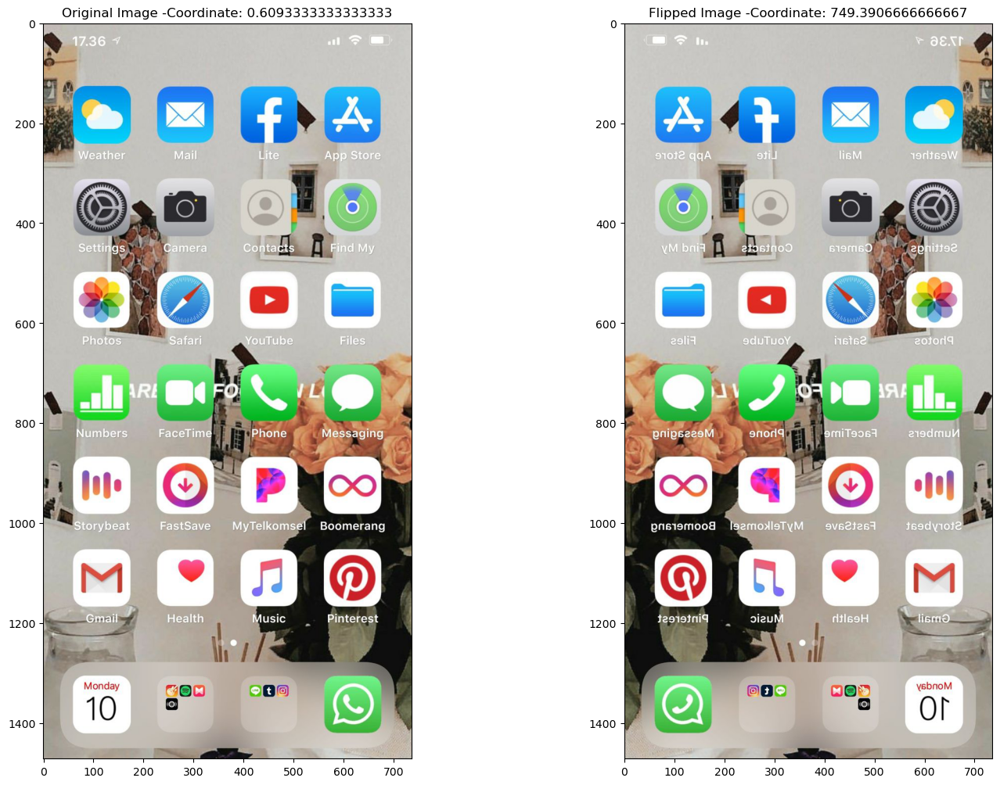

In [22]:
random_index = random.randint(0, 35)
image = image_paths[random_index]
coordination = coordinates_width[random_index][0]

original_image = mpimg.imread(image)
flipped_image, flipped_coordination = image_random_flip(original_image, coordination, random_index)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image -' + 'Coordinate: ' + str(coordination))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image -' + 'Coordinate: ' + str(flipped_coordination))

In [23]:
def random_augment(image, steering_angle, random_index):
  image = mpimg.imread(image)
  if np.random.rand() < 0.5:
    image = pan(image)
  if np.random.rand() < 0.5:
    image = zoom(image)
  if np.random.rand() < 0.5:
    image = img_random_brightness(image)
  #if np.random.rand() < 0.5:
    #image, steering_angle = image_random_flip(image, steering_angle, random_index)
  #if np.random.rand() < 0.5:
    #image, steering_angle = image_random_flip_vertical(image, steering_angle, random_index)
  return image, steering_angle

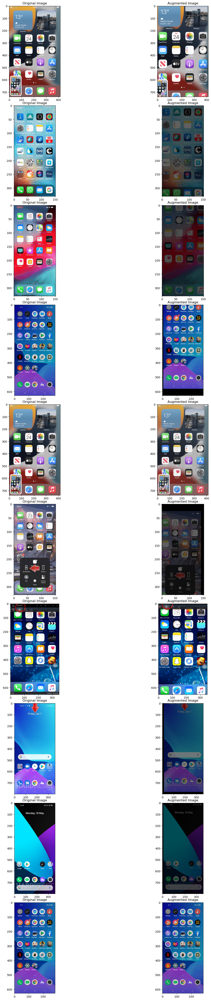

In [24]:
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths)-1)
  random_image = image_paths[randnum]
  random_steering = coordinates_width[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, coordinate = random_augment(random_image, random_steering, randnum)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title('Original Image')

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title('Augmented Image')

In [25]:
def img_preprocess(img):
  #img = img[60:135, :, :]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.medianBlur(img, 5)
  img = cv2.resize(img, (750, 1600))
  img = img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

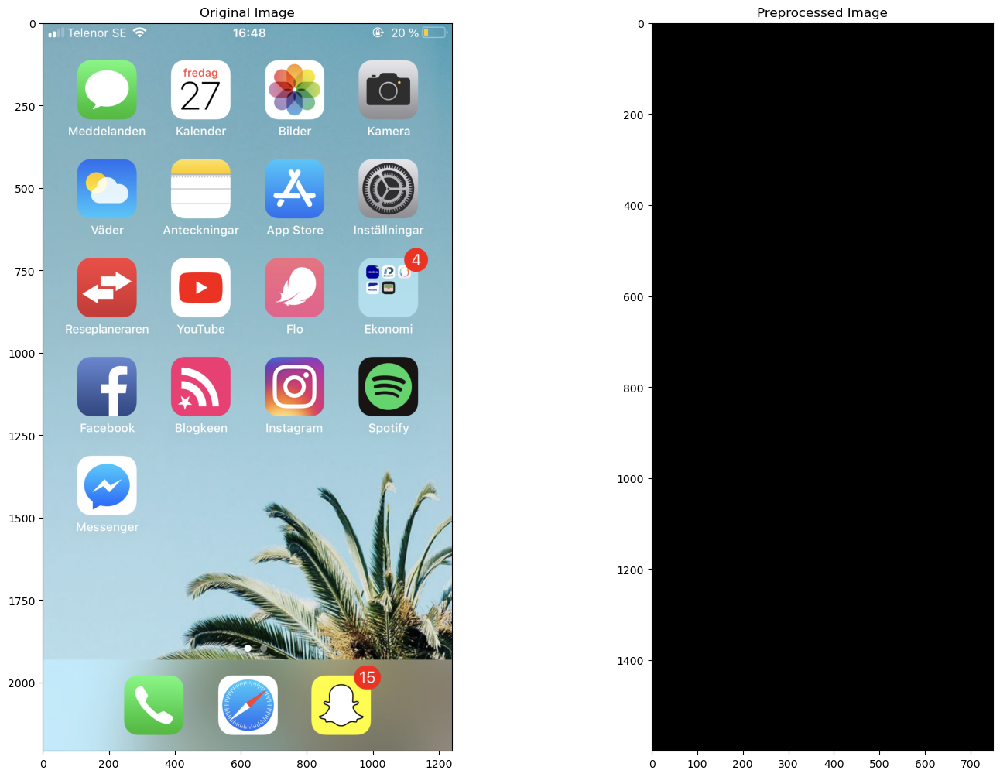

In [26]:
image = image_paths[0]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [27]:
def batch_generator(image_paths, coordinates, batch_size, istraining):
  while True:
    batch_img = []
    batch_coordinate = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths)-1)
      if istraining == True:
        im, coordinate = random_augment(image_paths[random_index], coordinates[random_index], random_index)
      else:
        im = mpimg.imread(image_paths[random_index])
        coordinate = coordinates[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_coordinate.append(coordinate)
    yield (np.asarray(batch_img), np.asarray(batch_coordinate))

Text(0.5, 1.0, 'Validation Image')

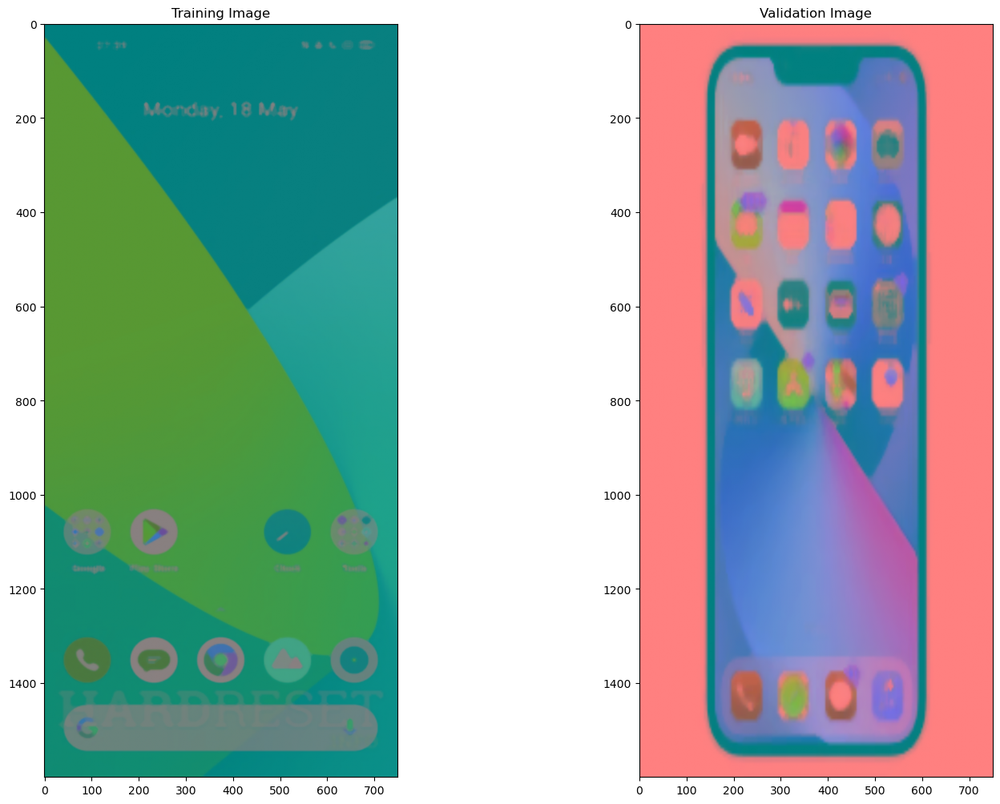

In [28]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

# Training image has more augmentation features than validation image
# Augmenting your training sets helps your model generalize to new data
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [29]:
def training_model():

  model = Sequential()
  model.add(Convolution2D(128, kernel_size=(5,5), strides=(2,2), input_shape=(750,1600,3),activation='elu'))
  model.add(Convolution2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Convolution2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Convolution2D(64, kernel_size=(3,3), activation='elu'))

  model.add(Convolution2D(64, kernel_size=(3,3), activation='elu'))
  # model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation='elu'))
  # model.add(Dropout(0.5))


  model.add(Dense(50, activation='elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(10, activation ='elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(2))


  optimizer= Adam(learning_rate=1e-4)
  model.compile(loss='mse', optimizer=optimizer)

  return model

In [30]:
model = training_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 373, 798, 128)     9728      
                                                                 
 conv2d_1 (Conv2D)           (None, 185, 397, 36)      115236    
                                                                 
 conv2d_2 (Conv2D)           (None, 91, 197, 48)       43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 89, 195, 64)       27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 87, 193, 64)       36928     
                                                                 
 flatten (Flatten)           (None, 1074624)           0         
                                                                 
 dense (Dense)               (None, 100)               1

In [31]:
X_train

array(['data\\47.jpg', 'data\\25.jpg', 'data\\20.jpg', 'data\\4.jpg',
       'data\\41.jpg', 'data\\29.png', 'data\\42.jpg', 'data\\30.png',
       'data\\35.jpg', 'data\\18.jpg', 'data\\22.jpg', 'data\\37.jpg',
       'data\\39.jpg', 'data\\19.jpg', 'data\\23.jpg', 'data\\44.jpg',
       'data\\6.png', 'data\\32.jpg', 'data\\28.jpg', 'data\\45.jpg',
       'data\\13.jpg', 'data\\3.png', 'data\\9.jpg', 'data\\46.png',
       'data\\5.png', 'data\\34.jpg', 'data\\27.jpg', 'data\\14.jpeg',
       'data\\12.jpg', 'data\\2.jpg', 'data\\26.jpg', 'data\\17.jpg',
       'data\\16.jpg', 'data\\43.jpg', 'data\\21.png', 'data\\36.jpg',
       'data\\10.jpg', 'data\\11.jpg'], dtype='<U12')

In [32]:
y_train

array([[1.46666667e-01, 1.95555556e-04],
       [1.33333333e-01, 1.77777778e-04],
       [2.74666667e-01, 3.66222222e-04],
       [1.48000000e-01, 1.97333333e-04],
       [3.58666667e-01, 4.78222222e-04],
       [8.01333333e-01, 1.06844444e-03],
       [3.37333333e-01, 4.49777778e-04],
       [0.00000000e+00, 0.00000000e+00],
       [1.44000000e-01, 1.92000000e-04],
       [0.00000000e+00, 0.00000000e+00],
       [1.48000000e-01, 1.97333333e-04],
       [3.85333333e-01, 5.13777778e-04],
       [2.49333333e-01, 3.32444444e-04],
       [1.16000000e-01, 1.54666667e-04],
       [0.00000000e+00, 0.00000000e+00],
       [2.26666667e-01, 3.02222222e-04],
       [1.10666667e-01, 1.47555556e-04],
       [1.94666667e-01, 2.59555556e-04],
       [1.13333333e-01, 1.51111111e-04],
       [1.49333333e-01, 1.99111111e-04],
       [1.42666667e-01, 1.90222222e-04],
       [1.44000000e-01, 1.92000000e-04],
       [1.44000000e-01, 1.92000000e-04],
       [1.48000000e-01, 1.97333333e-04],
       [9.733333

In [33]:
[print(i.shape, i.dtype) for i in model.inputs]
[print(o.shape, o.dtype) for o in model.outputs]
[print(l.name, l.input_shape, l.dtype) for l in model.layers]

(None, 750, 1600, 3) <dtype: 'float32'>
(None, 2) <dtype: 'float32'>
conv2d (None, 750, 1600, 3) float32
conv2d_1 (None, 373, 798, 128) float32
conv2d_2 (None, 185, 397, 36) float32
conv2d_3 (None, 91, 197, 48) float32
conv2d_4 (None, 89, 195, 64) float32
flatten (None, 87, 193, 64) float32
dense (None, 1074624) float32
dense_1 (None, 100) float32
dense_2 (None, 50) float32
dense_3 (None, 10) float32


[None, None, None, None, None, None, None, None, None, None]

In [34]:
y_valid

array([[1.37333333e-01, 1.83111111e-04],
       [2.90666667e-01, 3.87555556e-04],
       [1.50666667e-01, 2.00888889e-04],
       [1.33333333e-01, 1.77777778e-04],
       [1.48000000e-01, 1.97333333e-04],
       [2.73333333e-01, 3.64444444e-04],
       [1.52000000e-01, 2.02666667e-04],
       [1.49333333e-01, 1.99111111e-04],
       [1.26666667e-01, 1.68888889e-04],
       [1.94666667e-01, 2.59555556e-04]])

In [ ]:
#X_train = np.asarray(X_train).astype(np.float32)
#y_train = np.asarray(y_train).astype('int32')
history= model.fit_generator(batch_generator(X_train, y_train,
                             batch_size=5,
                             istraining=1),
                             steps_per_epoch=50,
                             epochs=10,
                             validation_data=batch_generator(X_valid, y_valid, 5, 0),
                             validation_steps=5,
                             verbose=1, 
                             shuffle=1)

C:\Users\I010994\AppData\Local\Temp\ipykernel_19560\1982393633.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history= model.fit_generator(batch_generator(X_train, y_train,


Epoch 1/10


In [ ]:
model.save('model_3.h5')

In [ ]:
from keras.models import load_model
loaded_model = load_model('model_3.h5')

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
def img_preprocess_2(img):
  #img = img[60:135, :, :]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.medianBlur(img, 5)
  img = cv2.resize(img, (1600, 750))
  return img

In [ ]:
image = image_paths[random.randint(0, 0)]
original_image = mpimg.imread(image)
original_image = np.asarray(original_image)
p_image = img_preprocess_2(original_image)
p_image.shape

In [ ]:
image = image_paths[random.randint(0, 30)]
image = mpimg.imread(image)
#image = np.asarray(original_image)
image = img_preprocess_2(image)
#image = image.resize((750, 1600))
image = np.expand_dims(np.array(image), axis=0)
#image = np.array([original_image])
predicted_array = []
print(f'The image size is {image.shape}')
predicted_array = loaded_model.predict(image)


In [ ]:
print(predicted_array)

In [ ]:
import cv2
image = image_paths[6]
image = mpimg.imread(image)
image = img_preprocess_2(image)
x_coord = int(predicted_array[0][0]*750)
y_coord = int(predicted_array[0][1]*1600)
width = 100
height = 100
temp1 = x_coord + 90
temp2 = y_coord + 90
top_left = (x_coord-90, y_coord-90)
bottom_right = (temp1, temp2)

color = (0, 255, 0)
thickness = 2
cv2.rectangle(image, top_left, bottom_right, color, thickness)

#cv2.imshow("image with bound box: ", image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
#fig.tight_layout()
axs[0].imshow(image)
axs[0].set_title(' Image with bound box')
cv2.waitKey(0)
cv2.destroyAllWindows()